# Visualization for Dissertation Chapter 3

*NTFA v2*


Using 


*Yiyu Wang 5/5/2023*


In [1]:
import NTFA_AVFP_helper
import matplotlib.pyplot as plt
import pickle
import glob
import numpy as np
import pandas as pd
from nilearn import plotting, image
import matplotlib.patches as mpatches
import scipy.stats as stats
import seaborn as sns
import itertools

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import statsmodels.formula.api as smf

from scipy.spatial.distance import cdist, pdist, squareform


%matplotlib inline

# set to show vector images
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
import matplotlib as mpl
mpl.rcParams['axes.linewidth'] = 2 #set the value globally

# set up directory:

nifti_dir = '/work/abslab/Yiyu/AVFP_analysis/denoised_visreg/'
logfiles_dir = '/work/abslab/AVFP/logfiles/AffVidsNovel_logfiles/'

mask_dir = '/work/abslab/AVFP/NTFA/masks/'
base_dir = '/work/abslab/Yiyu/NTFA_AVFP/'
figure_dir = base_dir + 'figures/'


SITUATION1 = 'Heights'
SITUATION2 = 'Social'
SITUATION3= 'Spiders'
# SITUATION_EXCLUDE = 'Spiders'

/home/wang.yiyu/.conda/envs/NTFA_env3/lib/python3.6/site-packages/nilearn/datasets/__init__.py:96: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [2]:
# **** parameters that define the model directory ******
# path for the NTFA package
which_ntfa_model = 'v2'

if which_ntfa_model == 'v1': 
    NTFA_path = "/work/abslab/NTFA_packages/NTFADegeneracy/"
elif which_ntfa_model == 'v2' :    
    NTFA_path = "/work/abslab/NTFA_packages/NTFADegeneracy_merged/"
print("NTFA code from:", NTFA_path)
import sys

subs = 'All' #20 #'All' #note, database file must have been created already for these subjects

included_data = pd.read_csv(base_dir + 'fmri_info/included_avfp_subjects.csv', header=None)
subIDs = included_data[0].astype('str').tolist()
print(subIDs)
total_subs = len(subIDs)
print(f"total subs = {total_subs}")

# using GM (and SNR) or SNR only?
mask_type = 'GMgroup'
# load mask:
if mask_type == 'GMgroup':
    mask_file = mask_dir +f'GM_fmriprep_novelgroup_mask_N71.nii.gz'
else:
    mask_file = mask_dir + 'gm_mask_icbm152_brain.nii.gz'

print('using mask: ', mask_file)


# penalty weights (participant, stimulus, combination)
p_weight, s_weight, c_weight = 1, 1, 1
linear_opts = 'None' # 'C', 'PSC' 'None'
# additional parameters:
n_epoch = 2000
n_factor = 100
n_check = 50 #

# load mask:
mask = image.load_img(mask_file)
mask_data = mask.get_fdata()

SEED = 2023
n_split = 6

NTFA code from: /work/abslab/NTFA_packages/NTFADegeneracy_merged/
['100', '103', '104', '105', '106', '107', '108', '109', '111', '112', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '127', '128', '130', '131', '132', '134', '135', '136', '137', '138', '139', '140', '142', '143', '144', '145', '146', '149', '150', '151', '152', '153', '154', '157', '158', '159', '160', '161', '162', '163', '164', '165', '166', '167', '169', '170', '171', '172', '174', '175', '176', '177', '179', '181', '182', '183', '184', '185', '186']
total subs = 71
using mask:  /work/abslab/AVFP/NTFA/masks/GM_fmriprep_novelgroup_mask_N71.nii.gz


In [3]:
# set up directory and filename for saving model
if subs != 'All':
    query_dir = f'models/ablation_comparison/AVFP_NTFA_sub-{subs}_epoch-{n_epoch}_factor-{n_factor}_mask-{mask_type}_{p_weight}{s_weight}{c_weight}_lin-{linear_opts}_ntfa-{which_ntfa_model}/'

else: #including all subjects
    query_dir = f'models/AVFP_NTFA_sub-{subs}_epoch-{n_epoch}_factor-{n_factor}_mask-{mask_type}_{p_weight}{s_weight}{c_weight}_lin-{linear_opts}_ntfa-{which_ntfa_model}_visreg/'

print("\nFetching model from: ", query_dir,'\n')


p_embedding = pickle.load(open(query_dir + 'p_embedding.pkl', 'rb'))
s_embedding = pickle.load(open(query_dir + 's_embedding.pkl', 'rb'))
c_embedding = pickle.load(open(query_dir + 'c_embedding.pkl', 'rb'))





Fetching model from:  models/AVFP_NTFA_sub-All_epoch-2000_factor-100_mask-GMgroup_111_lin-None_ntfa-v2_visreg/ 



In [4]:
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn import svm
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor



In [5]:
# load precalculated data:


all_embedding_rating_df = pd.read_csv(query_dir + 'all_embedding_recon_rating_df.csv')


video_list = np.unique(all_embedding_rating_df.video_number).astype(int).tolist()
print(f'total of videos are {len(video_list)}')
print("videos in this analysis:")
print(video_list)


total of videos are 36
videos in this analysis:
[1, 2, 3, 4, 5, 8, 9, 10, 12, 13, 16, 20, 21, 22, 24, 29, 32, 33, 35, 36, 39, 44, 48, 49, 50, 51, 58, 59, 60, 61, 64, 65, 69, 70, 71, 72]


# Final results

In [6]:
model_name_list = ['linear-SVR', 'RBF-SVR']
model_list =[svm.SVR(kernel = 'linear'), svm.SVR(kernel = 'rbf')]

video_cat_list = [NTFA_AVFP_helper.get_video_category(x) for x in video_list]

kf = StratifiedKFold(n_splits=n_split, shuffle=True, random_state = SEED)
for i, (train_idx, test_idx) in enumerate(kf.split(video_list, video_cat_list)):
    print(f'========================fold {i+1}==========================')
    data_train = np.array(video_list)[train_idx.astype(int)].tolist()
    data_test = np.array(video_list)[test_idx.astype(int)].tolist()
    video_cat = [NTFA_AVFP_helper.get_video_category(x) for x in data_test]
    print('training: ', data_train)
    
    print('testing: ', data_test)
    print(video_cat)

========================fold 1==========================
training:  [1, 2, 3, 5, 8, 9, 12, 13, 16, 20, 21, 22, 24, 29, 32, 33, 35, 36, 39, 44, 48, 49, 50, 51, 59, 61, 64, 65, 69, 70]
testing:  [4, 10, 58, 60, 71, 72]
['Heights', 'Heights', 'Social', 'Social', 'Spiders', 'Spiders']
========================fold 2==========================
training:  [1, 2, 4, 5, 9, 10, 12, 13, 16, 22, 24, 29, 32, 33, 35, 36, 39, 44, 48, 49, 50, 51, 58, 59, 60, 65, 69, 70, 71, 72]
testing:  [3, 8, 20, 21, 61, 64]
['Heights', 'Heights', 'Social', 'Social', 'Spiders', 'Spiders']
========================fold 3==========================
training:  [2, 3, 4, 5, 8, 10, 12, 13, 20, 21, 22, 24, 29, 35, 36, 39, 44, 48, 49, 50, 58, 59, 60, 61, 64, 65, 69, 70, 71, 72]
testing:  [1, 9, 16, 32, 33, 51]
['Heights', 'Heights', 'Social', 'Spiders', 'Spiders', 'Social']
========================fold 4==========================
training:  [1, 2, 3, 4, 5, 8, 9, 10, 12, 13, 16, 20, 21, 22, 24, 32, 33, 35, 36, 44, 49, 51, 58, 

In [7]:
stim_embedding_rating_df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()
kf = StratifiedKFold(n_splits=n_split, shuffle=True, random_state = SEED)

model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, video_list, video_cat_list, 'video_number', 's', 'fear', embedding_df=stim_embedding_rating_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
sc = np.concatenate(model_acc_list)
sc_rmse = np.concatenate(model_rmse_list)


model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.618760857016084
---------------------- fold 2 ---------------------------
0.9288719429646578
---------------------- fold 3 ---------------------------
-0.12390593465413446
---------------------- fold 4 ---------------------------
0.8633920246915101
---------------------- fold 5 ---------------------------
0.5787699926667439
---------------------- fold 6 ---------------------------
0.677658019693835
mean accuracy = 0.5905911503964494
mean rmse = 0.19208582801385102 

model :  SVR()
---------------------- fold 1 ---------------------------
0.46935115120974463
---------------------- fold 2 ---------------------------
0.8495365957872244
---------------------- fold 3 ---------------------------
-0.28951172001322645
---------------------- fold 4 ---------------------------
0.7766976364104325
---------------------- fold 5 ---------------------------
0.6512163511347407
---------------------- fold 6 ------

In [8]:

# c with subject cv

kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, subIDs, None, 'participant', 'c', 'fear', embedding_df=all_embedding_rating_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
c_sub = np.concatenate(model_acc_list)
c_sub_rmse = np.concatenate(model_rmse_list)


model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.06494555932014548
---------------------- fold 2 ---------------------------
0.06336084952835482
---------------------- fold 3 ---------------------------
0.07157977288438891
---------------------- fold 4 ---------------------------
0.1521744911982934
---------------------- fold 5 ---------------------------
0.11012326129851945
---------------------- fold 6 ---------------------------
0.09471491505113301
mean accuracy = 0.09281647488013918
mean rmse = 0.3251594816760579 

model :  SVR()
---------------------- fold 1 ---------------------------
0.1380551333980976
---------------------- fold 2 ---------------------------
0.11099697453343808
---------------------- fold 3 ---------------------------
0.1105908474117715
---------------------- fold 4 ---------------------------
0.18842647945287536
---------------------- fold 5 ---------------------------
0.1698749759164497
---------------------- fold 6 --

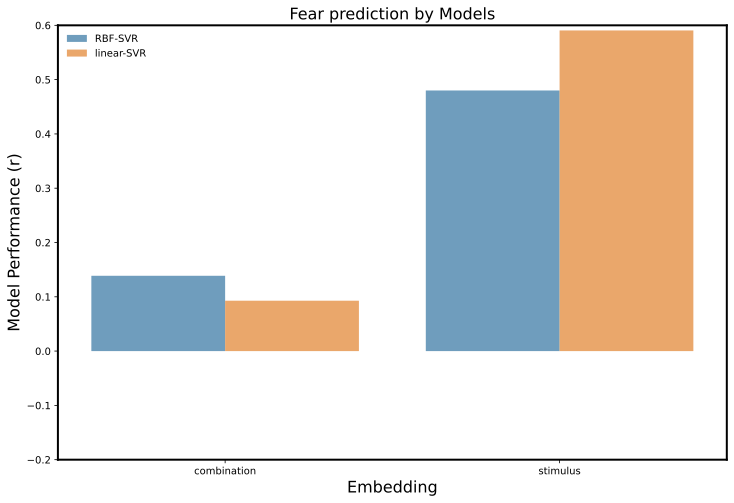

In [15]:
embedding_acc_df = pd.DataFrame({'c_sub': c_sub, 's_vid': sc})
embedding_acc_df['model'] = np.repeat(model_name_list, n_split)


embedding_rmse_df = pd.DataFrame({'c_sub': c_sub_rmse, 's_vid': sc_rmse})
embedding_rmse_df['model'] = np.repeat(model_name_list, n_split)


grouped = embedding_acc_df.groupby(['model']).mean().reset_index()

# Melt dataframe to create long-form data
melted = pd.melt(grouped, id_vars=['model'], var_name='variable', value_name='value')

# Create figure and axes objects
plt.figure(figsize=(12,8))

# Create bar plot with error bars and color codes using seaborn barplot function
sns.barplot(x='variable', y='value', hue='model', data=melted, ci=None, capsize=0.1, errwidth=1, alpha = .7)

# Set axis labels and plot title
plt.xlabel('Embedding', fontsize=16)
plt.ylabel('Model Performance (r)', fontsize=16)
plt.title('Fear prediction by Models', fontsize=16)
plt.legend(frameon=False)
plt.ylim(-.2, 0.6)
plt.xticks([0,1],['combination','stimulus'])
# Show plot
plt.show()

# Permutation test:

---------------------- fold 1 ---------------------------
0.0901881459848138
---------------------- fold 2 ---------------------------
0.05699989924270985
---------------------- fold 3 ---------------------------
0.04229313322464678
---------------------- fold 4 ---------------------------
0.1561572967063301
---------------------- fold 5 ---------------------------
0.07998739720364713
---------------------- fold 6 ---------------------------
0.07611609002560402
mean accuracy = 0.08362366039795861
mean rmse = 0.29232540713551997 



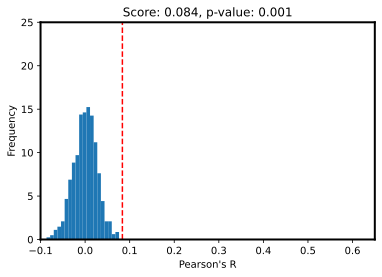

In [7]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'rbf')
data_column = 'participant'
data_id = subIDs
data_id_group = None
embedding_choice = 'c'
which_y ='valence'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
c_rbf_score = np.mean(acc_list)

pvalue, c_rbf_perm_scores = NTFA_AVFP_helper.RunPermutation(c_rbf_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

---------------------- fold 1 ---------------------------
0.11011431774432077
---------------------- fold 2 ---------------------------
0.04073734624528864
---------------------- fold 3 ---------------------------
0.004494635172657991
---------------------- fold 4 ---------------------------
0.09734308770226484
---------------------- fold 5 ---------------------------
0.07763987461047016
---------------------- fold 6 ---------------------------
0.07313645815577191
mean accuracy = 0.06724428660512906
mean rmse = 0.2908764000370077 



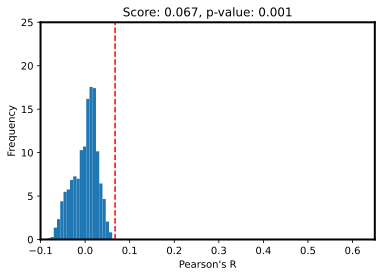

In [8]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'linear')
data_column = 'participant'
embedding_choice = 'c'
data_id = subIDs
data_id_group = None
which_y ='valence'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
c_linear_score = np.mean(acc_list)

pvalue, c_linear_perm_scores = NTFA_AVFP_helper.RunPermutation(c_linear_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

(0.0, 25.0)

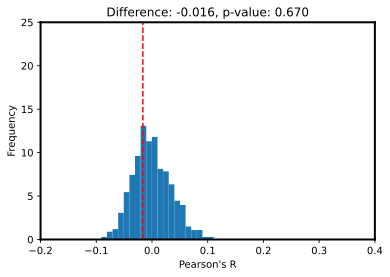

In [9]:
# calculate the difference:

c_perm_difference =c_rbf_perm_scores - c_linear_perm_scores
diff_score = c_linear_score - c_rbf_score
c_diff_p = NTFA_AVFP_helper.PermutationP(c_perm_difference, diff_score, 1000)

fig, ax = plt.subplots()

ax.hist(c_perm_difference, bins=20, density=True)
ax.axvline(diff_score, ls="--", color="r")
ax.set_title(f"Difference: {diff_score:.3f}, p-value: {c_diff_p:.3f}")
ax.set_xlabel("Pearson's R")
_ = ax.set_ylabel("Frequency")
ax.set_xlim([-0.2, 0.4])
ax.set_ylim([0, 25])

---------------------- fold 1 ---------------------------
-0.06638597332417
---------------------- fold 2 ---------------------------
0.634690712535697
---------------------- fold 3 ---------------------------
0.5714963979058053
---------------------- fold 4 ---------------------------
0.2715530593100788
---------------------- fold 5 ---------------------------
0.541423865732272
---------------------- fold 6 ---------------------------
0.5093530660941492
mean accuracy = 0.41035518804230536
mean rmse = 0.19116655411035866 



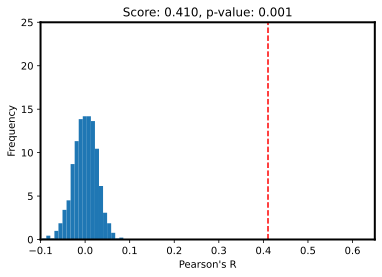

In [10]:
stim_embedding_rating_df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'rbf')
data_column = 'video_number'
data_id = video_list
data_id_group = video_cat_list
embedding_choice = 's'
which_y ='valence'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=stim_embedding_rating_df, verbose=True)
s_rbf_score = np.mean(acc_list)

pvalue, rbf_perm_scores = NTFA_AVFP_helper.RunPermutation(s_rbf_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)



---------------------- fold 1 ---------------------------
-0.16980711832535972
---------------------- fold 2 ---------------------------
0.6617594259107529
---------------------- fold 3 ---------------------------
0.822325055250297
---------------------- fold 4 ---------------------------
0.6989177352875867
---------------------- fold 5 ---------------------------
0.7399038027322993
---------------------- fold 6 ---------------------------
0.5722655180934163
mean accuracy = 0.5542274031581654
mean rmse = 0.1621745223616217 



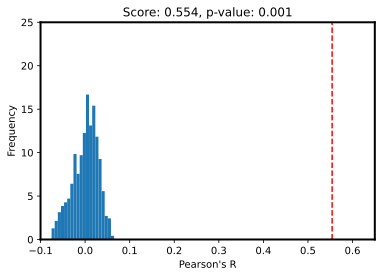

In [11]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'linear')
data_column = 'video_number'
data_id = video_list
data_id_group = video_cat_list
embedding_choice = 's'
which_y ='valence'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=stim_embedding_rating_df, verbose=True)
s_linear_score = np.mean(acc_list)

pvalue, linear_perm_scores = NTFA_AVFP_helper.RunPermutation(s_linear_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)



(0.0, 25.0)

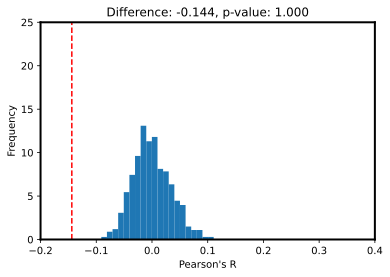

In [12]:
# calculate the difference:

perm_difference = rbf_perm_scores - linear_perm_scores
diff_score = s_rbf_score - s_linear_score
diff_p = NTFA_AVFP_helper.PermutationP(perm_difference, diff_score, 1000)
fig, ax = plt.subplots()

ax.hist(c_perm_difference, bins=20, density=True)
ax.axvline(diff_score, ls="--", color="r")
ax.set_title(f"Difference: {diff_score:.3f}, p-value: {diff_p:.3f}")
ax.set_xlabel("Pearson's R")
_ = ax.set_ylabel("Frequency")
ax.set_xlim([-0.2, 0.4])
ax.set_ylim([0, 25])

---------------------- fold 1 ---------------------------
0.0058618870403154884
---------------------- fold 2 ---------------------------
0.05179307383203632
---------------------- fold 3 ---------------------------
0.13413781574204794
---------------------- fold 4 ---------------------------
0.12768453715067984
---------------------- fold 5 ---------------------------
0.09544645153698496
---------------------- fold 6 ---------------------------
0.06799109039026266
mean accuracy = 0.08048580928205452
mean rmse = 0.2766235060148505 



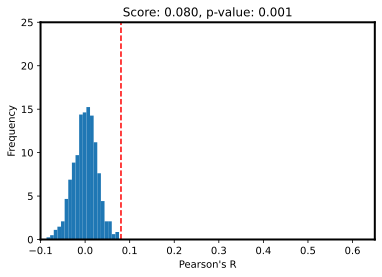

In [13]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'rbf')
data_column = 'participant'
data_id = subIDs
data_id_group = None
embedding_choice = 'c'
which_y ='arousal'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
c_rbf_score = np.mean(acc_list)

pvalue, c_rbf_perm_scores = NTFA_AVFP_helper.RunPermutation(c_rbf_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

---------------------- fold 1 ---------------------------
0.07797724390266102
---------------------- fold 2 ---------------------------
0.10577298640586318
---------------------- fold 3 ---------------------------
0.02891366158635056
---------------------- fold 4 ---------------------------
0.16878569608718508
---------------------- fold 5 ---------------------------
0.03116795277889424
---------------------- fold 6 ---------------------------
0.08247787822814029
mean accuracy = 0.08251590316484907
mean rmse = 0.2749915335955501 



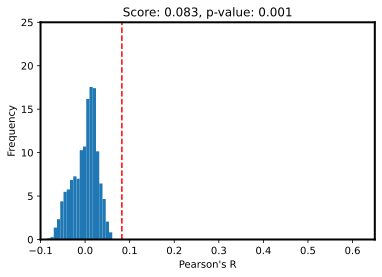

In [14]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'linear')
data_column = 'participant'
embedding_choice = 'c'
data_id = subIDs
data_id_group = None
which_y ='arousal'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
c_linear_score = np.mean(acc_list)

pvalue, c_linear_perm_scores = NTFA_AVFP_helper.RunPermutation(c_linear_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

(0.0, 25.0)

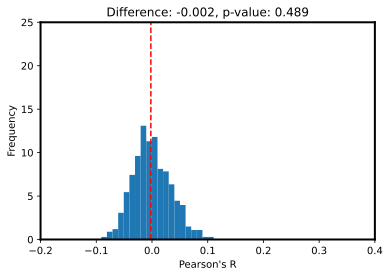

In [15]:
# calculate the difference:

c_perm_difference =c_rbf_perm_scores - c_linear_perm_scores
diff_score = c_rbf_score - c_linear_score
c_diff_p = NTFA_AVFP_helper.PermutationP(c_perm_difference, diff_score, 1000)

fig, ax = plt.subplots()

ax.hist(c_perm_difference, bins=20, density=True)
ax.axvline(diff_score, ls="--", color="r")
ax.set_title(f"Difference: {diff_score:.3f}, p-value: {c_diff_p:.3f}")
ax.set_xlabel("Pearson's R")
_ = ax.set_ylabel("Frequency")
ax.set_xlim([-0.2, 0.4])
ax.set_ylim([0, 25])

---------------------- fold 1 ---------------------------
0.17224877381659687
---------------------- fold 2 ---------------------------
0.6018261642578572
---------------------- fold 3 ---------------------------
0.4998599343898428
---------------------- fold 4 ---------------------------
0.26497448865048195
---------------------- fold 5 ---------------------------
0.850417453550857
---------------------- fold 6 ---------------------------
0.48480234480143136
mean accuracy = 0.4790215265778445
mean rmse = 0.13602452439501383 



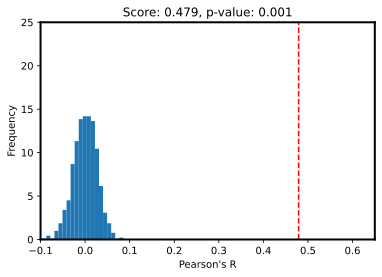

In [16]:
stim_embedding_rating_df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'rbf')
data_column = 'video_number'
data_id = video_list
data_id_group = video_cat_list
embedding_choice = 's'
which_y ='arousal'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=stim_embedding_rating_df, verbose=True)
s_rbf_score = np.mean(acc_list)

pvalue, rbf_perm_scores = NTFA_AVFP_helper.RunPermutation(s_rbf_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)



---------------------- fold 1 ---------------------------
-0.042646687666574874
---------------------- fold 2 ---------------------------
0.2268346910020806
---------------------- fold 3 ---------------------------
0.44719703165696767
---------------------- fold 4 ---------------------------
0.941673382678859
---------------------- fold 5 ---------------------------
0.7375979533039041
---------------------- fold 6 ---------------------------
0.151319372371112
mean accuracy = 0.41032929055772477
mean rmse = 0.14572024064409292 



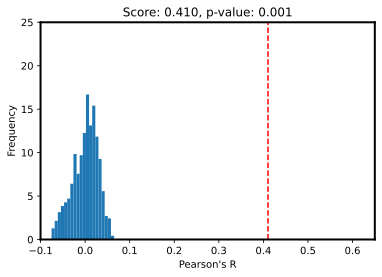

In [17]:
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'linear')
data_column = 'video_number'
data_id = video_list
data_id_group = video_cat_list
embedding_choice = 's'
which_y ='arousal'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=stim_embedding_rating_df, verbose=True)
s_linear_score = np.mean(acc_list)

pvalue, linear_perm_scores = NTFA_AVFP_helper.RunPermutation(s_linear_score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)



(0.0, 25.0)

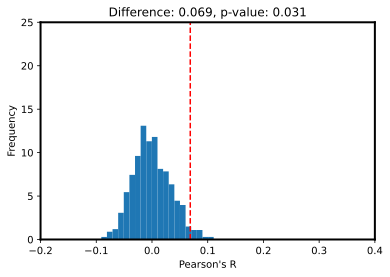

In [18]:
# calculate the difference:

perm_difference = rbf_perm_scores - linear_perm_scores
diff_score = s_rbf_score - s_linear_score
diff_p = NTFA_AVFP_helper.PermutationP(perm_difference, diff_score, 1000)
fig, ax = plt.subplots()

ax.hist(c_perm_difference, bins=20, density=True)
ax.axvline(diff_score, ls="--", color="r")
ax.set_title(f"Difference: {diff_score:.3f}, p-value: {diff_p:.3f}")
ax.set_xlabel("Pearson's R")
_ = ax.set_ylabel("Frequency")
ax.set_xlim([-0.2, 0.4])
ax.set_ylim([0, 25])

In [ ]:
s_nonlinear = [0.2740472233385062, 0.7761146750773072, 0.8067424061316844, 0.6297028744036478, 0.7653178021675918,0.5455988148861023]
s_linear = [-0.11481455501756714, 0.3304516951991064, 0.7383961358771824, 0.9459007482049799, 0.8337054736880211, 0.5127284102398771]

print('s-linear and s-nonlienar:', np.corrcoef(s_nonlinear, s_linear)[0,1])
print(np.mean(s_nonlinear))
print(np.mean(s_linear))

# Participant embedding

In [15]:

def median_labeler(data, median):
    if data < median:
        return 'Low'
    else:
        return 'High'

p_embedding.rename({"x": "p_x", 
           "y": "p_y", "x_sigma": "p_x_sigma", "y_sigma": "p_y_sigma"}, 
          axis = "columns", inplace = True)

# scaled by max survey score
trait_data = pd.read_csv('/work/abslab/Yiyu/AVFP_analysis/BehavData/AVFP_QA_trait_demeaned.csv',delimiter =',',index_col=0)
trait_data = trait_data.fillna(0)
demeaned_trait_df = trait_data[trait_data['subj_id'].isin(p_embedding.participant)]

# # raw trait df
# trait_data = pd.read_csv('/work/abslab/Yiyu/AVFP_analysis/fmri_info/AVFP_all_sub_trait_surveys_20220228.csv')
# trait_df = trait_data[trait_data['subj_id'].isin(p_embedding.participant)]


demeaned_trait_df=demeaned_trait_df.rename(columns = {'subj_id':'participant'})
demeaned_trait_df['participant'] = demeaned_trait_df['participant'].apply(str)

p_embedding_trait_df = p_embedding.merge(demeaned_trait_df, how='left', on='participant')


p_embedding_trait_df = p_embedding_trait_df.assign(age_cat=
                                 pd.Series([median_labeler(age, np.nanmedian(p_embedding_trait_df['age'].values)) for age in list(p_embedding_trait_df['age'].values)]).values)

p_embedding_trait_df = p_embedding_trait_df.assign(anxiety_cat=
                                 pd.Series([median_labeler(x, np.nanmedian(p_embedding_trait_df['anxiety'].values)) for x in list(p_embedding_trait_df['anxiety'].values)]).values)



In [16]:
p_embedding_trait_df

,participant,p_x,p_y,p_x_sigma,p_y_sigma,index,age,gender,cesd_sum,TA_sum,Asq_sum,heights_phobia,social_phobia,spider_phobia,anxiety,age_cat,anxiety_cat
0,100,-0.848184,0.851428,0.190717,0.131943,0,28,2,0.150000,0.16,0.00,0.308333,0.513889,0.031746,0.180556,High,High
1,103,1.983523,1.634727,0.164942,0.083380,3,38,2,0.033333,0.13,0.00,0.025000,0.041667,0.000000,0.000000,High,Low
2,104,-0.618048,-1.148886,0.144029,0.193200,4,35,2,0.183333,0.12,0.00,0.083333,0.111111,0.357143,0.125000,High,Low
3,105,0.357600,-0.545447,0.279174,0.311324,5,31,1,0.500000,0.54,0.00,0.158333,0.541667,0.015873,0.583333,High,High
4,106,-0.893657,0.116754,0.193053,0.218188,6,34,2,0.066667,0.17,0.00,0.033333,0.055556,0.015873,0.138889,High,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,182,-0.505109,-1.118202,0.210888,0.239520,81,23,1,0.066667,0.08,0.00,0.183333,0.375000,0.047619,0.041667,High,Low
67,183,0.104247,-0.918051,0.209169,0.259805,82,22,1,0.000000,0.06,0.10,0.066667,0.055556,0.023810,0.013889,Low,Low
68,184,-0.726025,1.872060,0.166333,0.085948,83,19,1,0.516667,0.25,0.24,0.141667,0.430556,0.293651,0.611111,Low,High
69,185,0.635994,0.602926,0.140746,0.196560,84,19,1,0.233333,0.19,0.14,0.525000,0.375000,0.968254,0.236111,Low,High


In [14]:
model_name_list = ['linear-SVR', 'RBF-SVR']
model_list =[svm.SVR(kernel = 'linear'), svm.SVR(kernel = 'rbf')]


# c with subject cv
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, subIDs, None, 'participant', 'p', 'anxiety', embedding_df=p_embedding_trait_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
p_anx = np.concatenate(model_acc_list)
p_anx_rmse = np.concatenate(model_rmse_list)

model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.08162504575546653
---------------------- fold 2 ---------------------------
0.5407951522784044
---------------------- fold 3 ---------------------------
0.416905038431298
---------------------- fold 4 ---------------------------
-0.06397133250244787
---------------------- fold 5 ---------------------------
0.019581038405288027
---------------------- fold 6 ---------------------------
-0.06815975548101706
mean accuracy = 0.15446253114783198
mean rmse = 0.21538323334870094 

model :  SVR()
---------------------- fold 1 ---------------------------
-0.007724344953268932
---------------------- fold 2 ---------------------------
0.0639783734531128
---------------------- fold 3 ---------------------------
0.546487380557907
---------------------- fold 4 ---------------------------
-0.05972184913838442
---------------------- fold 5 ---------------------------
-0.06382665707876589
---------------------- fol

In [18]:
model_name_list = ['linear-SVR', 'RBF-SVR']
model_list =[svm.SVR(kernel = 'linear'), svm.SVR(kernel = 'rbf')]


# c with subject cv
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, subIDs, None, 'participant', 'p', 'age', embedding_df=p_embedding_trait_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
p_anx = np.concatenate(model_acc_list)
p_anx_rmse = np.concatenate(model_rmse_list)

model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.36052311383707625
---------------------- fold 2 ---------------------------
0.7418411301621087
---------------------- fold 3 ---------------------------
0.6372525965298496
---------------------- fold 4 ---------------------------
0.08872834843193521
---------------------- fold 5 ---------------------------
-0.2693658869255875
---------------------- fold 6 ---------------------------
0.2679226107275922
mean accuracy = 0.30448365212716244
mean rmse = 6.273739074523419 

model :  SVR()
---------------------- fold 1 ---------------------------
0.4186229322082482
---------------------- fold 2 ---------------------------
0.6618959503484528
---------------------- fold 3 ---------------------------
-0.0738852883606272
---------------------- fold 4 ---------------------------
0.22018558998179613
---------------------- fold 5 ---------------------------
-0.16653153005041602
---------------------- fold 6 ---

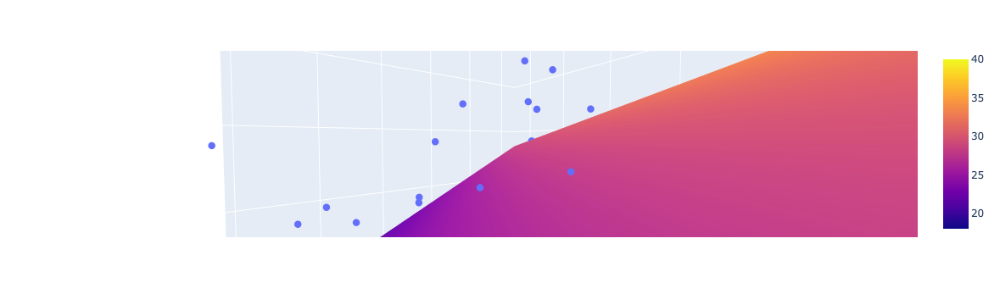

In [21]:
mesh_size = .02
margin = 0

df = p_embedding_trait_df.copy()
zmin = 18
zmax = 40


X = df[['p_x', 'p_y']]
y = df['age']


model = svm.SVR(kernel = 'linear')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.p_x.min() - margin, X.p_x.max() + margin
y_min, y_max = X.p_y.min() - margin, X.p_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='p_x', y='p_y', z='age')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
#fig.write_html("figures/participant_svr-linear_anxiety_prediction_surface_raw.html")

In [17]:
from sklearn.svm import SVC
model_name_list = ['linear-SVC', 'RBF-SVC']
model_list =[svm.SVC(kernel = 'linear'), svm.SVC(kernel = 'rbf')]

from sklearn.metrics import accuracy_score

acc = accuracy_score

# c with subject cv
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, subIDs, None, 'participant', 'p', 'gender', embedding_df=p_embedding_trait_df, acc = acc, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
p_gender = np.concatenate(model_acc_list)
p_gender_rmse = np.concatenate(model_rmse_list)

model :  SVC(kernel='linear')
---------------------- fold 1 ---------------------------
0.3333333333333333
---------------------- fold 2 ---------------------------
0.5
---------------------- fold 3 ---------------------------
0.3333333333333333
---------------------- fold 4 ---------------------------
0.5833333333333334
---------------------- fold 5 ---------------------------
0.6666666666666666
---------------------- fold 6 ---------------------------
0.2727272727272727
mean accuracy = 0.44823232323232326
mean rmse = 0.7644582764302988 

model :  SVC()
---------------------- fold 1 ---------------------------
0.3333333333333333
---------------------- fold 2 ---------------------------
0.5
---------------------- fold 3 ---------------------------
0.25
---------------------- fold 4 ---------------------------
0.75
---------------------- fold 5 ---------------------------
0.5833333333333334
---------------------- fold 6 ---------------------------
0.45454545454545453
mean accuracy = 0.4

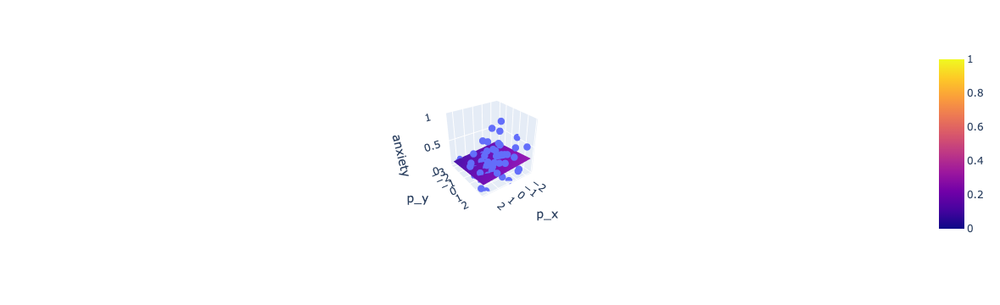

In [20]:
mesh_size = .02
margin = 0

df = p_embedding_trait_df.copy()
zmin = 0
zmax = 1


X = df[['p_x', 'p_y']]
y = df['anxiety']


model = svm.SVR(kernel = 'linear')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.p_x.min() - margin, X.p_x.max() + margin
y_min, y_max = X.p_y.min() - margin, X.p_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='p_x', y='p_y', z='anxiety')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/participant_svr-linear_anxiety_prediction_surface_raw.html")

In [21]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.write_html("figures/participant_svr-linear_anxiety_prediction_surface_raw_surfonly.html")

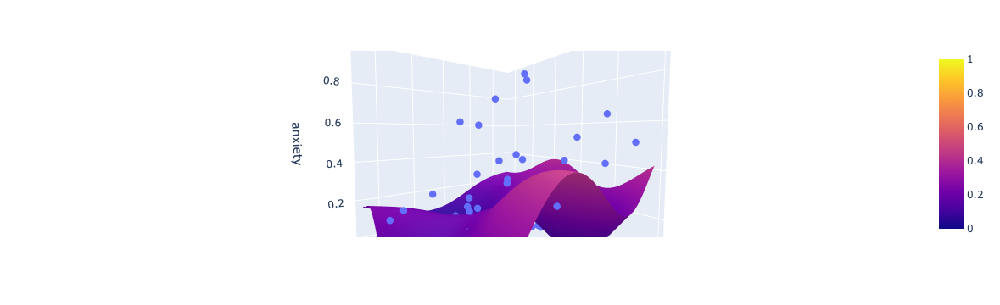

In [22]:
mesh_size = .02
margin = 0

df = p_embedding_trait_df.copy()
zmin = 0
zmax = 1


X = df[['p_x', 'p_y']]
y = df['anxiety']


model = svm.SVR(kernel = 'rbf')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.p_x.min() - margin, X.p_x.max() + margin
y_min, y_max = X.p_y.min() - margin, X.p_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='p_x', y='p_y', z='anxiety')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/participant_svr-rbf_anxiety_prediction_surface_raw.html")

In [23]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.write_html("figures/participant_svr-rbf_anxiety_prediction_surface_raw_surfonly.html")

# supplementary

In [24]:
SEED = 2023
model_name_list = ['linear-SVR', 'RBF-SVR']
model_list =[svm.SVR(kernel = 'linear'), svm.SVR(kernel = 'rbf')]





# c with subject cv
kf = KFold(n_splits=n_split, shuffle=True, random_state = SEED)
model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, subIDs, None, 'participant', 'c', 'fear', embedding_df=all_embedding_rating_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
c_sub = np.concatenate(model_acc_list)
c_sub_rmse = np.concatenate(model_rmse_list)

# sc only

kf = StratifiedKFold(n_splits=n_split, shuffle=True, random_state = SEED)

model_acc_list = []
model_rmse_list = []
for model in model_list:
    print('model : ', model)
    test_acc_list, test_rmse_list, model = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, video_list, video_cat_list, 'video_number', 'sc', 'fear', embedding_df=all_embedding_rating_df, verbose=True)
    model_acc_list.append(test_acc_list)
    model_rmse_list.append(test_rmse_list)
sc = np.concatenate(model_acc_list)
sc_rmse = np.concatenate(model_rmse_list)



embedding_acc_df = pd.DataFrame({'c_sub': c_sub, 'sc': sc})
embedding_acc_df['model'] = np.repeat(model_name_list, n_split)


embedding_rmse_df = pd.DataFrame({'c_sub': c_sub_rmse, 'sc': sc_rmse})
embedding_rmse_df['model'] = np.repeat(model_name_list, n_split)

model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.06494555932012698
---------------------- fold 2 ---------------------------
0.06336084952829639
---------------------- fold 3 ---------------------------
0.07152443501255501
---------------------- fold 4 ---------------------------
0.15216233440399723
---------------------- fold 5 ---------------------------
0.11019582800118578
---------------------- fold 6 ---------------------------
0.09465837169621905
mean accuracy = 0.09280789632706339
mean rmse = 0.32515731050640917 

model :  SVR()
---------------------- fold 1 ---------------------------
0.13786140565802082
---------------------- fold 2 ---------------------------
0.11099697453343325
---------------------- fold 3 ---------------------------
0.11059084741177785
---------------------- fold 4 ---------------------------
0.1884264794528571
---------------------- fold 5 ---------------------------
0.169874975916451
---------------------- fold 6 

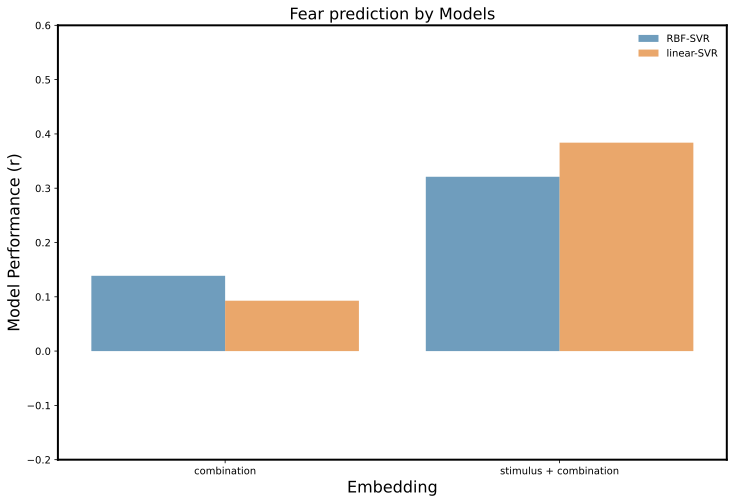

In [25]:
grouped = embedding_acc_df.groupby(['model']).mean().reset_index()


# Melt dataframe to create long-form data
melted = pd.melt(grouped, id_vars=['model'], var_name='variable', value_name='value')

# Create figure and axes objects
plt.figure(figsize=(12,8))

# Create bar plot with error bars and color codes using seaborn barplot function
sns.barplot(x='variable', y='value', hue='model', data=melted, ci=None, capsize=0.1, errwidth=1, alpha = .7)

# Set axis labels and plot title
plt.xlabel('Embedding', fontsize=16)
plt.ylabel('Model Performance (r)', fontsize=16)
plt.title('Fear prediction by Models', fontsize=16)
plt.legend(frameon=False)
plt.ylim(-.2, 0.6)
plt.xticks([0,1],['combination','stimulus + combination'])
# Show plot
plt.show()

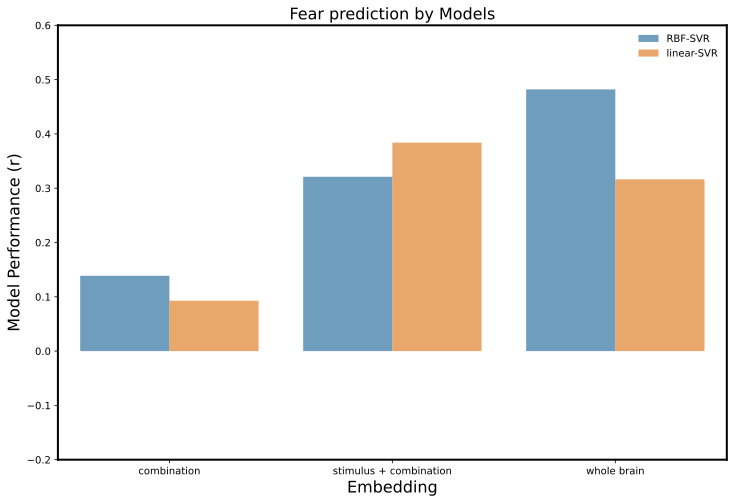

In [26]:
grouped = embedding_acc_df.groupby(['model']).mean().reset_index()
grouped['whole_brain']= [0.482,0.31627]

# Melt dataframe to create long-form data
melted = pd.melt(grouped, id_vars=['model'], var_name='variable', value_name='value')

# Create figure and axes objects
plt.figure(figsize=(12,8))

# Create bar plot with error bars and color codes using seaborn barplot function
sns.barplot(x='variable', y='value', hue='model', data=melted, ci=None, capsize=0.1, errwidth=1, alpha = .7)

# Set axis labels and plot title
plt.xlabel('Embedding', fontsize=16)
plt.ylabel('Model Performance (r)', fontsize=16)
plt.title('Fear prediction by Models', fontsize=16)
plt.legend(frameon=False)
plt.ylim(-.2, 0.6)
plt.xticks([0,1,2],['combination','stimulus + combination', 'whole brain'])
# Show plot
plt.show()

---------------------- fold 1 ---------------------------
0.23146692256337897
---------------------- fold 2 ---------------------------
0.6356545040779037
---------------------- fold 3 ---------------------------
-0.13087327932521292
---------------------- fold 4 ---------------------------
0.5402816195986139
---------------------- fold 5 ---------------------------
0.3674321537747963
---------------------- fold 6 ---------------------------
0.2825705805561558
mean accuracy = 0.321088750207606
mean rmse = 0.3222250316888818 



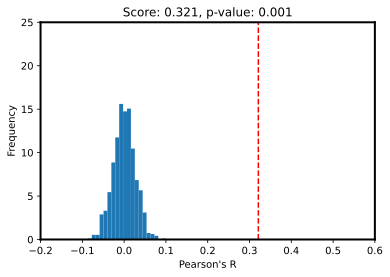

In [27]:

kf = StratifiedKFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'rbf')
data_column = 'video_number'
embedding_choice = 'sc'
data_id = video_list
data_id_group = video_cat_list
which_y ='fear'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
score = np.mean(acc_list)
pvalue, perm_scores = NTFA_AVFP_helper.RunPermutation(score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

---------------------- fold 1 ---------------------------
0.3012418336786815
---------------------- fold 2 ---------------------------
0.7176439023350522
---------------------- fold 3 ---------------------------
-0.04376904485978196
---------------------- fold 4 ---------------------------
0.5240158295559662
---------------------- fold 5 ---------------------------
0.3687525815930697
---------------------- fold 6 ---------------------------
0.4355816408579397
mean accuracy = 0.3839111238601545
mean rmse = 0.3143584697401849 



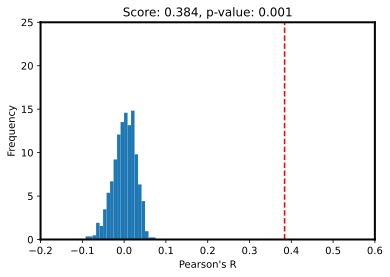

In [28]:
import NTFA_AVFP_helper
kf = StratifiedKFold(n_splits=n_split, shuffle=True, random_state = SEED)
model = svm.SVR(kernel = 'linear')
data_column = 'video_number'
embedding_choice = 'sc'
data_id = video_list
data_id_group = video_cat_list
which_y ='fear'

acc_list, _, _, = NTFA_AVFP_helper.TrainEmbeddingModel(model, kf, data_id, data_id_group, data_column, embedding_choice, which_y, embedding_df=all_embedding_rating_df, verbose=True)
score = np.mean(acc_list)
pvalue, perm_scores = NTFA_AVFP_helper.RunPermutation(score, model, None, embedding_choice, all_embedding_rating_df, n_split = n_split, n_permutation = 1000)

# T test between R values


Whole Brain:
model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.3532563240949037
---------------------- fold 2 ---------------------------
0.3507794175259327
---------------------- fold 3 ---------------------------
0.28467426808995594
---------------------- fold 4 ---------------------------
0.3066494287021099
---------------------- fold 5 ---------------------------
0.329161223037173
---------------------- fold 6 ---------------------------
0.27310387046546164
mean accuracy = 0.31627075531925614 


model :  SVR()
---------------------- fold 1 ---------------------------
0.4836369501548845
---------------------- fold 2 ---------------------------
0.47235470911219307
---------------------- fold 3 ---------------------------
0.4763430730064344
---------------------- fold 4 ---------------------------
0.4441946761801434
---------------------- fold 5 ---------------------------
0.518206916485614
---------------------- fold 6 ---------------------------
0.497522096692664
mean accuracy = 0.4820430702719889 



sc embedding - sub cv
model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.2732398286358088
---------------------- fold 2 ---------------------------
0.3521683571803979
---------------------- fold 3 ---------------------------
0.4264368605427355
---------------------- fold 4 ---------------------------
0.3810612183177799
---------------------- fold 5 ---------------------------
0.45992883360555076
---------------------- fold 6 ---------------------------
0.36485302041180695
mean accuracy = 0.37628135311567995
mean rmse = 0.30573735680938846 

model :  SVR()
---------------------- fold 1 ---------------------------
0.4601119779835785
---------------------- fold 2 ---------------------------
0.5084256032613381
---------------------- fold 3 ---------------------------
0.5610858924590278
---------------------- fold 4 ---------------------------
0.5108266167952685
---------------------- fold 5 ---------------------------
0.6002320095923119
---------------------- fold 6 ---------------------------
0.4982803422229075
mean accuracy = 0.5231604070524054
mean rmse = 0.28001667813552256 


sc-embedding vid:
SVR linear
---------------------- fold 1 ---------------------------
0.3012418336786815
---------------------- fold 2 ---------------------------
0.7176439023350522
---------------------- fold 3 ---------------------------
-0.04376904485978196
---------------------- fold 4 ---------------------------
0.5240158295559662
---------------------- fold 5 ---------------------------
0.3687525815930697
---------------------- fold 6 ---------------------------
0.4355816408579397


SVR non linear:
---------------------- fold 1 ---------------------------
0.23146692256337897
---------------------- fold 2 ---------------------------
0.6356545040779037
---------------------- fold 3 ---------------------------
-0.13087327932521292
---------------------- fold 4 ---------------------------
0.5402816195986139
---------------------- fold 5 ---------------------------
0.3674321537747963
---------------------- fold 6 ---------------------------
0.2825705805561558


c embedding:
model :  SVR(kernel='linear')
---------------------- fold 1 ---------------------------
0.06494555932012698
---------------------- fold 2 ---------------------------
0.06336084952829639
---------------------- fold 3 ---------------------------
0.07152443501255501
---------------------- fold 4 ---------------------------
0.15216233440399723
---------------------- fold 5 ---------------------------
0.11019582800118578
---------------------- fold 6 ---------------------------
0.09465837169621905
mean accuracy = 0.09280789632706339
mean rmse = 0.32515731050640917 

model :  SVR()
---------------------- fold 1 ---------------------------
0.13786140565802082
---------------------- fold 2 ---------------------------
0.11099697453343325
---------------------- fold 3 ---------------------------
0.11059084741177785
---------------------- fold 4 ---------------------------
0.1884264794528571
---------------------- fold 5 ---------------------------
0.169874975916451
---------------------- fold 6 ---------------------------
0.1144161304902676
mean accuracy = 0.1386944689104679
mean rmse = 0.3261662542268802 


In [6]:
# whole-brain predictor performance copied here:

# linear svr
whole_brain_r_linear = [0.353, 0.351, 0.285, 0.307, 0.330, 0.273]
c_r_linear = [0.065, 0.063, 0.072, 0.152, 0.110, 0.095]
sc_sub_r_linear = [0.273, 0.352, 0.426, 0.381, 0.460, 0.365]
sc_vid_r_linear = [0.301, 0.718, -0.044, 0.524, 0.369, 0.436]


print('sc_sub and whole brain:', np.corrcoef(whole_brain_r_linear, sc_sub_r_linear)[0,1])
print('sc_vid and whole brain:', np.corrcoef(whole_brain_r_linear, sc_vid_r_linear)[0,1])

sc_sub and whole brain: -0.4221146113064993
sc_vid and whole brain: 0.42372524823774976


In [8]:
# rbf svr


whole_brain_r_nonlin = [0.484, 0.472, 0.476, 0.444, 0.518, 0.497]
c_r_nonlin = [0.138, 0.111, 0.111, 0.188, 0.170, 0.114]
sc_sub_r_nonlin = [0.460, 0.508, 0.561, 0.511, 0.600, 0.498]
sc_vid_r_nonlin = [0.231, 0.636, -0.131, 0.540, 0.367, 0.283]

print('sc_sub and whole brain:', np.corrcoef(whole_brain_r_nonlin, sc_sub_r_nonlin)[0,1])
print('sc_vid and whole brain:', np.corrcoef(whole_brain_r_nonlin, sc_vid_r_nonlin)[0,1])

sc_sub and whole brain: 0.4280314021166532
sc_vid and whole brain: -0.23389919467947015


In [9]:
print('c-linear and c-nonlienar:', np.corrcoef(c_r_nonlin, c_r_linear)[0,1])
print(np.mean(c_r_nonlin))
print(np.mean(c_r_linear))

c-linear and c-nonlienar: 0.8426343604592923


In [11]:
np.mean(c_r_nonlin)

0.1386666666666667

In [12]:
np.mean(c_r_linear)

0.09283333333333332

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Given dataframe
data = {
    'model': ["linear-c_embedding"]*6 + ["rbf-c_embedding"]*6 + [""]*6
    'fold': [1, 2, 3, 4, 5, 6]*4,
    'corr': [0.255164, 0.182128, 0.205872, 0.130847, 0.178803, 0.195144, 0.154364, 0.144880, 0.060588, 0.111340, 0.139779, 0.203261, 0.317724, 0.250398, 0.253903, 0.226334, 0.221775, 0.245231, 0.177913, 0.174935, 0.136777, 0.150000, 0.142917, 0.192297],
    'rmse': [0.357713, 0.352444, 0.346303, 0.356399, 0.359410, 0.363448, 0.365412, 0.342868, 0.355262, 0.342066, 0.354750, 0.356033, 0.348746, 0.335916, 0.340642, 0.335652, 0.348818, 0.354059, 0.364274, 0.339194, 0.339943, 0.333333, 0.351669, 0.356522]
}
df = pd.DataFrame(linear_data)

# Split the 'model' column into two new columns: 'kernel' and 'data_type'
df['kernel'], df['data_type'] = df['model'].str.split("-").str

# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='kernel', y='corr', hue='data_type', data=df)
plt.xlabel('Kernel Type')
plt.ylabel('Correlation')
plt.title('Brain decoder to predict from reconstruction and activations')
plt.legend(title='Testing Data Type')
plt.show()

SyntaxError: invalid syntax (<ipython-input-13-60c170b36259>, line 8)

# make bar plots for table 1

# Prediction Surface plots:

In [ ]:
# plot rbf SVR

zmin = 0
zmax = 1


import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.svm import SVR

mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy()

X = df[['c_x', 'c_y']]
y = df['fear']


model = svm.SVR(kernel = 'rbf')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.c_x.min() - margin, X.c_x.max() + margin
y_min, y_max = X.c_y.min() - margin, X.c_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='c_x', y='c_y', z='fear')
fig.update_traces(marker=dict(size=2))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/combination_svr-rbf_prediction_surface_raw.html")

In [ ]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.write_html("figures/combination_svr-rbf_prediction_surface_raw_surfonly.html")

In [ ]:



mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()

X = df[['s_x', 's_y']]
y = df['fear']


model = svm.SVR(kernel = 'rbf')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.s_x.min() - margin, X.s_x.max() + margin
y_min, y_max = X.s_y.min() - margin, X.s_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='s_x', y='s_y', z='fear')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))

# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/stimulus_svr-rbf_prediction_surface_raw.html")

In [ ]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))

fig.write_html("figures/stimulus_svr-rbf_prediction_surface_raw_surfonly.html")

In [ ]:
mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()

X = df[['s_x', 's_y']]
y = df['fear']


model = svm.SVR(kernel = 'linear')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.s_x.min() - margin, X.s_x.max() + margin
y_min, y_max = X.s_y.min() - margin, X.s_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='s_x', y='s_y', z='fear')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))

# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))

fig.show()
fig.write_html("figures/stimulus_svr-linear_prediction_surface_raw.html")

In [ ]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))

fig.write_html("figures/stimulus_svr-linear_prediction_surface_raw_surfonly.html")

In [ ]:


mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy().groupby('stimulus').mean().reset_index()

X = df[['s_x', 's_y']]
y = df['fear']


model = MLPRegressor(max_iter=700)
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.s_x.min() - margin, X.s_x.max() + margin
y_min, y_max = X.s_y.min() - margin, X.s_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='s_x', y='s_y', z='fear')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))

# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()

In [ ]:
mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy()

X = df[['c_x', 'c_y']]
y = df['fear']


model = MLPRegressor(max_iter=700)
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.c_x.min() - margin, X.c_x.max() + margin
y_min, y_max = X.c_y.min() - margin, X.c_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='c_x', y='c_y', z='fear')
fig.update_traces(marker=dict(size=2))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()

In [ ]:



mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy().groupby('participant').mean().reset_index()

X = df[['p_x', 'p_y']]
y = df['fear']


model = svm.SVR(kernel = 'rbf')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.p_x.min() - margin, X.p_x.max() + margin
y_min, y_max = X.p_y.min() - margin, X.p_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='p_x', y='p_y', z='fear')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/participant_svr-rbf_prediction_surface_raw.html")

In [ ]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))

fig.write_html("figures/participant_svr-rbf_prediction_surface_raw_surfonly.html")

In [ ]:



mesh_size = .02
margin = 0

df = all_embedding_rating_df.copy().groupby('participant').mean().reset_index()

X = df[['p_x', 'p_y']]
y = df['fear']


model = svm.SVR(kernel = 'linear')
model.fit(X, y)

# Create a mesh grid on which we will run our model
x_min, x_max = X.p_x.min() - margin, X.p_x.max() + margin
y_min, y_max = X.p_y.min() - margin, X.p_y.max() + margin
xrange = np.arange(x_min, x_max, mesh_size)
yrange = np.arange(y_min, y_max, mesh_size)
xx, yy = np.meshgrid(xrange, yrange)

# Run model
pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
pred = pred.reshape(xx.shape)

# Generate the plot
fig = px.scatter_3d(df, x='p_x', y='p_y', z='fear')
fig.update_traces(marker=dict(size=5))
fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))
fig.show()
fig.write_html("figures/participant_svr-linear_prediction_surface_raw.html")

In [ ]:
fig = go.Figure(data=(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface', cmin=zmin, cmax=zmax)))
# Update the z-axis limits
fig.update_layout(scene=dict(zaxis=dict(range=[zmin, zmax])))

fig.write_html("figures/participant_svr-linear_prediction_surface_raw_surfonly.html")